**1) First we copy the weights from Drive to this folder**

In [0]:
%cp -r '/content/drive/My Drive/YoloV3Weights/' /content/

In [9]:
%cd /content/YoloV3Weights/

/content/YoloV3Weights


As we can see the weights file are placed here

In [13]:
%ls

coco.names  yolov3.cfg  yolov3.weights


Now we will write a custom function to input and image, predict the yolo custom classes and draw the bounding box around the image.

In [0]:
import cv2
import time
from google.colab.patches import cv2_imshow
import numpy as np
import matplotlib.pyplot as plt

In [0]:
configPath = "/content/YoloV3Weights/yolov3.cfg"
weightsPath = "/content/YoloV3Weights/yolov3.weights"
labelsPath= '/content/YoloV3Weights/coco.names'

First we will read in the Yolo weights and the configuration file.

In [0]:
# Load Yolo
net = cv2.dnn.readNet(weightsPath, configPath)
classes = []
with open(labelsPath, "r") as f:
    classes = [line.strip() for line in f.readlines()]
layer_names = net.getLayerNames()
output_layers = [layer_names[i[0] - 1] for i in net.getUnconnectedOutLayers()]
colors = np.random.uniform(0, 255, size=(len(classes), 3))

In [0]:
def YoloDetector(Image):
  img = cv2.imread(Image)
  #img = cv2.resize(img, None, fx=0.4, fy=0.4)
  height, width, channels = img.shape

  # Detecting objects
  blob = cv2.dnn.blobFromImage(img, 0.00392, (416, 416), (0, 0, 0), True, crop=False)

  net.setInput(blob)
  outs = net.forward(output_layers)

  # Showing informations on the screen
  class_ids = []
  confidences = []
  boxes = []
  for out in outs:
      for detection in out:
          scores = detection[5:]
          class_id = np.argmax(scores)
          confidence = scores[class_id]
          if confidence > 0.5:
              # Object detected
              center_x = int(detection[0] * width)
              center_y = int(detection[1] * height)
              w = int(detection[2] * width)
              h = int(detection[3] * height)

              # Rectangle coordinates
              x = int(center_x - w / 2)
              y = int(center_y - h / 2)

              boxes.append([x, y, w, h])
              confidences.append(float(confidence))
              class_ids.append(class_id)
  indexes = cv2.dnn.NMSBoxes(boxes, confidences, 0.5, 0.4)
  
  font = cv2.FONT_HERSHEY_PLAIN
  for i in range(len(boxes)):
      if i in indexes:
          x, y, w, h = boxes[i]
          label = str(classes[class_ids[i]])
          color = colors[i]
          cv2.rectangle(img, (x, y), (x + w, y + h), color, 2)
          cv2.putText(img, label, (x, y + 30), cv2.FONT_HERSHEY_SIMPLEX,
              2, color, 2)
          #cv2.putText(img, label, (x, y + 30), font, 2, color, 2)
  cv2_imshow(img)
  #imgplot = plt.imshow(img)
  #plt.show()

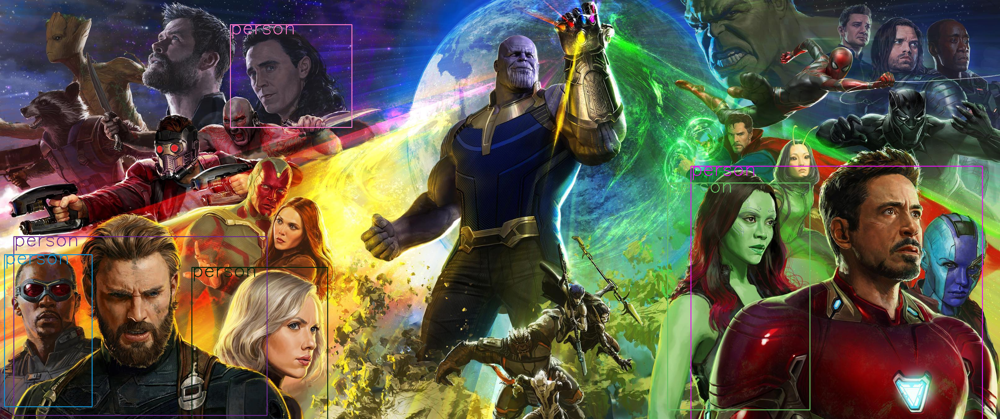

In [60]:
YoloDetector('Avengers.jpg')

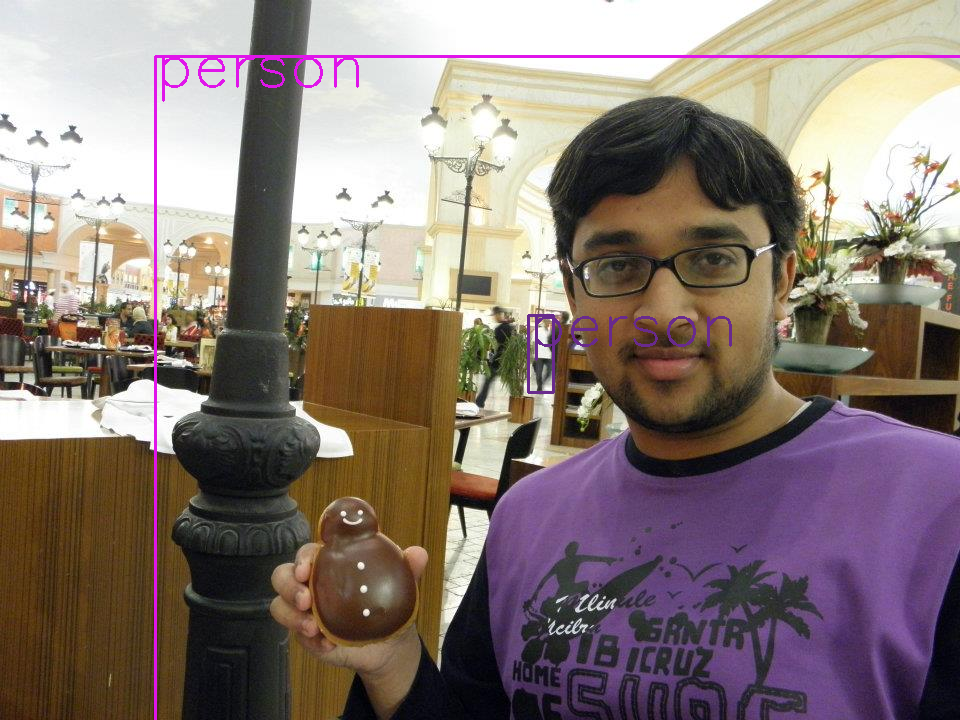

In [61]:
# Trying on custom image
YoloDetector('Myself.jpg')

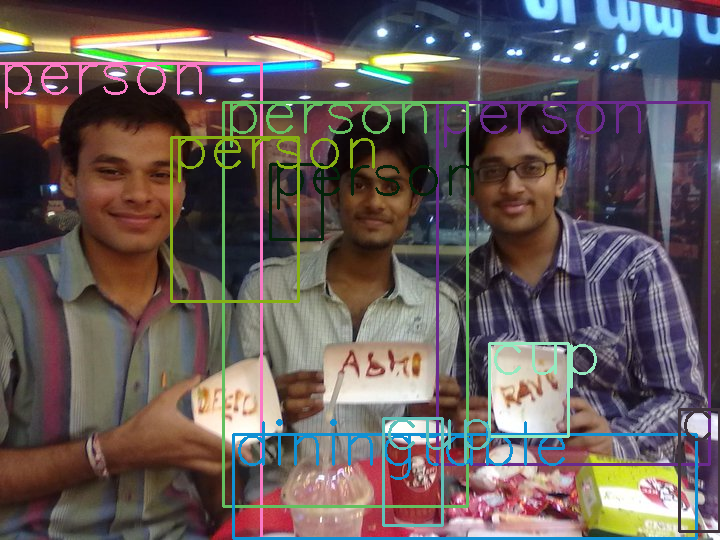

In [62]:
# Another Image
YoloDetector('Friends.jpg')